In [11]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

from scipy.ndimage.interpolation import zoom
from PIL import Image
from scipy.misc import imsave
import glob
from os.path import basename
from scipy.misc import imresize


from keras import Model
from keras.models import load_model
from keras.layers import Conv2D, Input, Dense,Flatten,LeakyReLU
from keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping
from keras import backend as K
import tensorflow as tf
import keras
print(K.backend())

from image_helper import *

tensorflow


# Load Data

In [40]:
augmented_train_data, augmented_train_label = load_augmented_data("./augmented_data/", "train")
print(augmented_train_data.shape)
augmented_validation_data, augmented_validation_label = load_augmented_data("./augmented_data/", "val")
augmented_test_data, augmented_test_label = load_augmented_data("./augmented_data/", "test")

partition_dict, labels_dict = get_generator_dicts("./augmented_data/")

(412, 326, 490, 3)


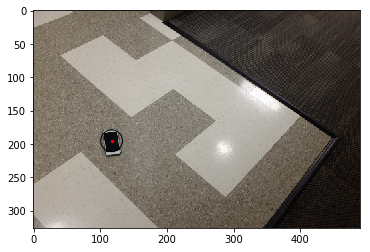

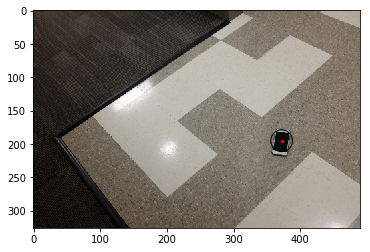

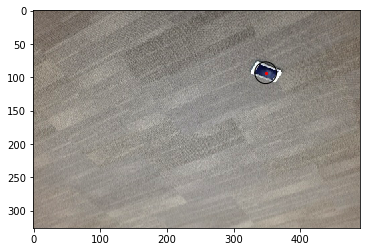

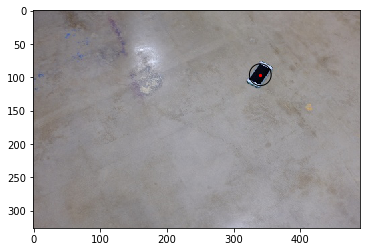

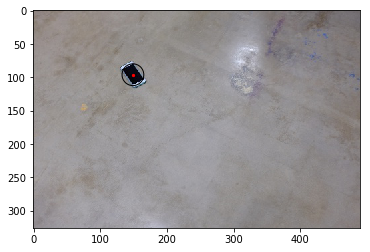

...

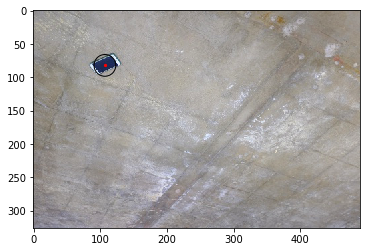

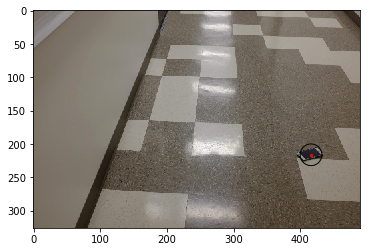

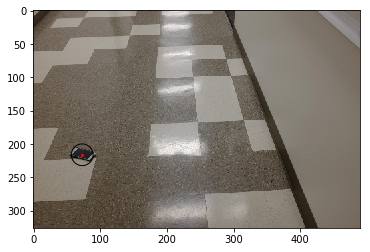

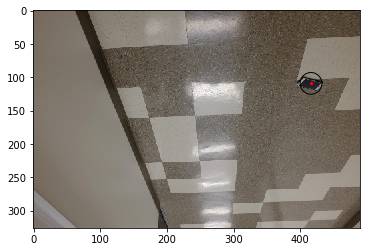

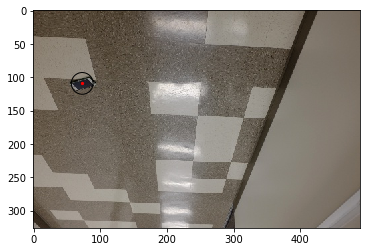

In [39]:
for i, im_ in enumerate(augmented_train_data[:20]):
    plot_with_label(im_, augmented_train_label[i][0], augmented_train_label[i][1])

In [12]:
resize_factor = 0.6
augmented_train_data_resized = np.zeros((augmented_train_data.shape[0], imresize(augmented_train_data[0], resize_factor).shape[0], imresize(augmented_train_data[0], resize_factor).shape[1], 3))
augmented_validation_data_resized = np.zeros((augmented_validation_data.shape[0], imresize(augmented_validation_data[0], resize_factor).shape[0], imresize(augmented_validation_data[0], resize_factor).shape[1], 3))


for i, im in enumerate(augmented_train_data):
    augmented_train_data_resized[i] = imresize(im, resize_factor)/255
    

for i, im in enumerate(augmented_validation_data):
    augmented_validation_data_resized[i] = imresize(im, resize_factor)/255
    #plot_with_label(augmented_validation_data_resized[i], augmented_validation_label[i][0], augmented_validation_label[i][1])
    
augmented_train_data = augmented_train_data_resized
augmented_validation_data = augmented_validation_data_resized

C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  
C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  import sys
C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instea

In [4]:
class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, path, list_IDs, labels, batch_size=32, dim=(32,32,32), n_channels=3,
                  shuffle=True, fully_convolutional = True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.labels = labels
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.shuffle = shuffle
        self.on_epoch_end()
        self.path = path

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, 2), dtype=float)

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # Store sample
            X[i,] = imresize(np.array(Image.open(self.path + ID + '.png')), resize_factor)/255
            

            # Store class
            y[i,0], y[i,1] = self.labels[ID]
            

        return X, y

# Model

In [13]:
tbCallBack = TensorBoard(log_dir='./logs/regression', histogram_freq=2, batch_size=32, write_graph=True, write_grads=True, write_images=True)
cpCallBack = ModelCheckpoint('./checkpoints/regression/weights-improvement-{epoch:02d}-{val_loss:.2f}.hdf5', monitor='val_loss', verbose=0, save_best_only=False, save_weights_only=False, mode='auto', period=3)
esCallBack = EarlyStopping(monitor='val_loss', min_delta=0, patience=3, verbose=0, mode='auto')

K.clear_session()
sess = tf.Session()
K.set_session(sess)

In [14]:
input_img = Input(shape=(augmented_train_data[0].shape[0], augmented_train_data[0].shape[1], 3))

x = Conv2D(3, (1, 1), padding='same', use_bias=False)(input_img)
x = LeakyReLU(alpha=0.3)(x)
x = Conv2D(8, (3, 3), padding='same', use_bias=False)(x)
x = LeakyReLU(alpha=0.3)(x)
x = Conv2D(8, (3, 3), padding='same', use_bias=False)(x)
x = LeakyReLU(alpha=0.3)(x)
x = Conv2D(1, (1, 1), padding='same', use_bias=False)(x)
x = LeakyReLU(alpha=0.3)(x)
x = Flatten()(x)
x = Dense(8, activation='relu', use_bias=False)(x)


output = Dense(2, use_bias=False)(x)

model = Model(inputs=input_img, outputs=output)

from keras import optimizers
#sgd = optimizers.SGD(lr=1e-11, decay=1e-6, momentum=0.9, nesterov=True, clipnorm=1e-9)
model.compile(optimizer="adam", loss='mean_squared_error')

#tbCallBack.set_model(model)
print(model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 195, 294, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 195, 294, 3)       9         
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 195, 294, 3)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 195, 294, 8)       216       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 195, 294, 8)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 195, 294, 8)       576       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 195, 294, 8)       0         
__________

In [32]:
params = {'dim': (augmented_train_data[0].shape[0],augmented_train_data[0].shape[1]),
          'batch_size': 32,
          'n_channels': 3,
          'shuffle': True}
training_generator = DataGenerator("./augmented_data/data/", partition_dict['train'], labels_dict, **params)
validation_generator = DataGenerator("./augmented_data/data/", partition_dict['val'], labels_dict, **params)

#history = model.fit_generator(generator=training_generator, validation_data=[augmented_validation_data, augmented_validation_label], epochs=3, callbacks=[cpCallBack, esCallBack])


history = model.fit(augmented_train_data_resized, augmented_train_label, validation_data=[augmented_validation_data_resized, augmented_validation_label] ,epochs=10, batch_size=32, callbacks=[tbCallBack, cpCallBack, esCallBack])

Train on 412 samples, validate on 80 samples
Epoch 1/10
412/412 [==============================] - 22s 54ms/step - loss: 2.8395e-04 - val_loss: 1.5460e-04
Epoch 2/10
412/412 [==============================] - 22s 54ms/step - loss: 2.8440e-04 - val_loss: 1.8251e-04
Epoch 3/10
412/412 [==============================] - 22s 54ms/step - loss: 3.0437e-04 - val_loss: 1.5990e-04
Epoch 4/10
412/412 [==============================] - 25s 61ms/step - loss: 2.9141e-04 - val_loss: 1.4891e-04
Epoch 5/10
412/412 [==============================] - 23s 55ms/step - loss: 2.7859e-04 - val_loss: 1.5324e-04
Epoch 6/10
412/412 [==============================] - 23s 56ms/step - loss: 2.7187e-04 - val_loss: 1.5074e-04
Epoch 7/10
412/412 [==============================] - 23s 56ms/step - loss: 2.7258e-04 - val_loss: 1.4098e-04
Epoch 8/10
412/412 [==============================] - 23s 56ms/step - loss: 2.6286e-04 - val_loss: 1.3734e-04
Epoch 9/10
412/412 [==============================] - 22s 54ms/step - loss:

In [35]:
model_ = load_model("./checkpoints/regression/weights-improvement-09-0.00.hdf5")

[[0.2315306  0.5999811 ]
 [0.7655504  0.60845774]
 [0.71519613 0.29175028]
 [0.6935643  0.29970402]
 [0.3078454  0.30024958]
 [0.6963171  0.70472413]
 [0.27157113 0.72030604]
 [0.5859912  0.21396622]
 [0.41615894 0.2130292 ]
 [0.58753645 0.7949494 ]]


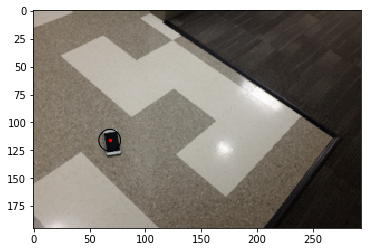

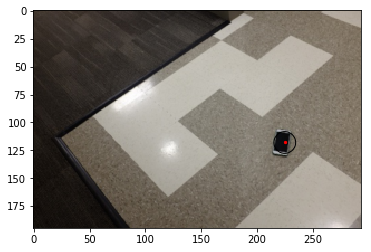

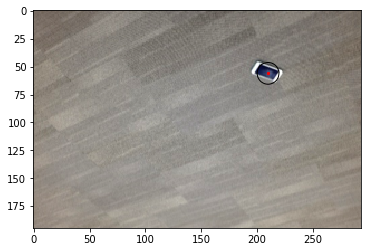

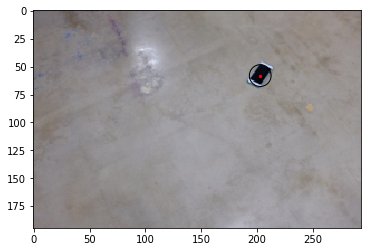

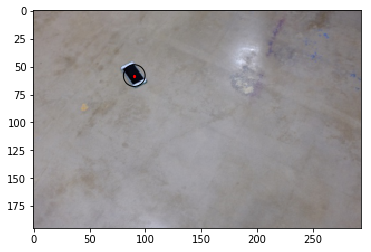

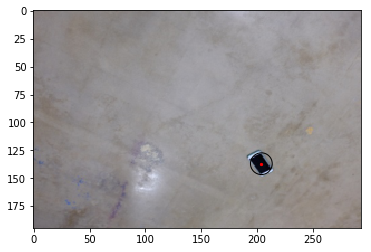

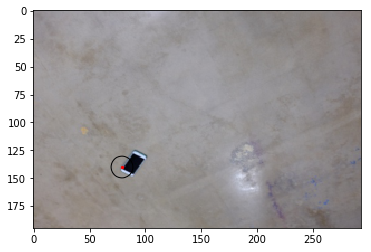

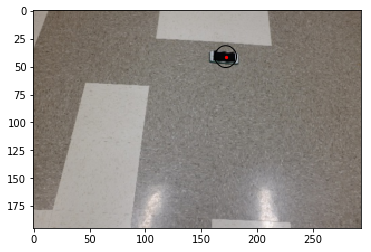

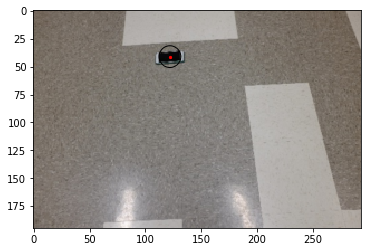

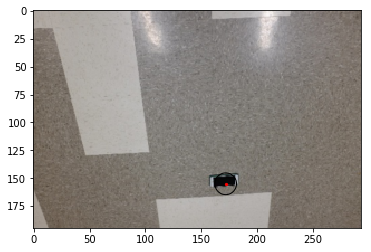

In [36]:
predictions = model_.predict(augmented_train_data_resized[:10])
print(predictions)
for i, pred in enumerate(predictions):
    plot_with_label(augmented_train_data_resized[i], pred[0], pred[1])

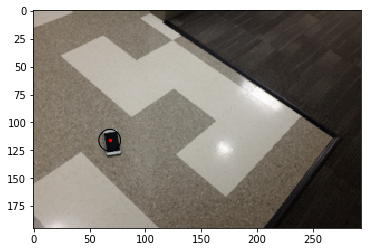

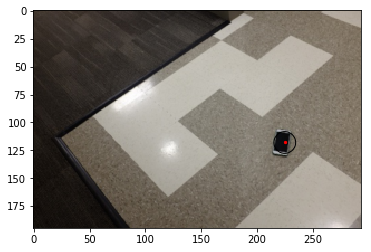

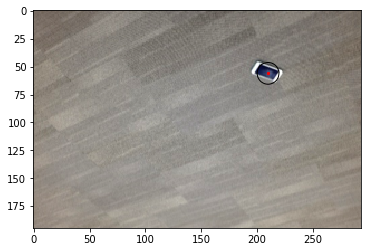

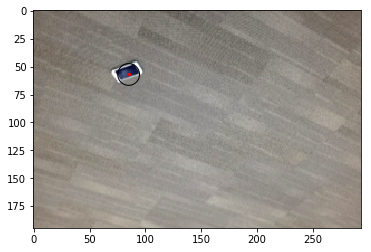

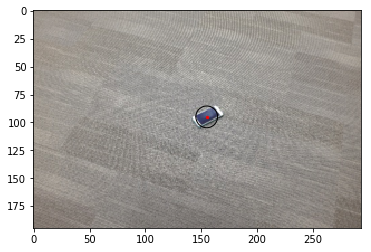

...

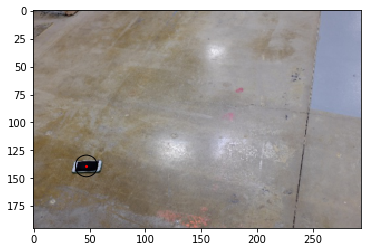

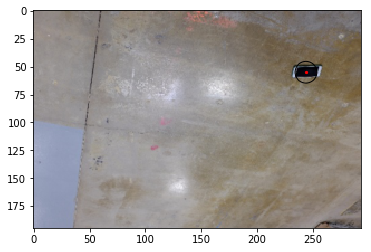

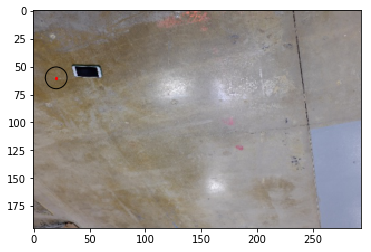

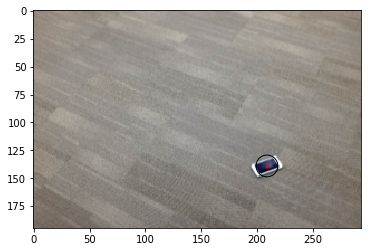

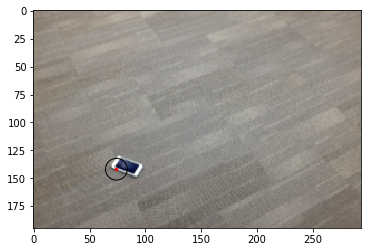

In [37]:
predictions = model_.predict(augmented_validation_data_resized)
for i, pred in enumerate(predictions):
    plot_with_label(augmented_validation_data_resized[i], pred[0], pred[1])